# Book Recommendations

## Use book recommendations to build a simple model that predicts books

In [1]:
# Get data from http://www2.informatik.uni-freiburg.de/~cziegler/BX/
import matplotlib.pyplot as plt
import numpy as np
url = 'http://www2.informatik.uni-freiburg.de/~cziegler/BX/BX-CSV-Dump.zip'


In [2]:
import zipfile
import urllib
import os

root_folder = "bx"
dest_directory = os.path.join("../../data/MyData", root_folder)

def getData():
    global url
    global dest_directory
    #data = urllib.urlopen(url)
    
    zipfile_name = url.split("/")[-1]
    if not os.path.exists(dest_directory):
        os.makedirs(dest_directory)
    
    zip_path = os.path.join(dest_directory, zipfile_name)
    if not os.path.exists(zip_path):
        zip_file = urllib.urlopen(url)
        # write it to file
        with open(zip_path, "wb") as fh:
            fh.write(zip_file.read())
        
    if not filter(lambda f: f != zipfile_name, os.listdir(dest_directory)):
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(dest_directory)
            
    
    
    
getData()
os.listdir(dest_directory)

['BX-Book-Ratings.csv', 'BX-Users.csv', 'BX-Books.csv', 'BX-CSV-Dump.zip']

In [3]:
BOOK_RATINGS_FILE = os.path.join(dest_directory, "BX-Book-Ratings.csv")
USERS_FILE        = os.path.join(dest_directory, "BX-Users.csv")
BOOKS_FILE        = os.path.join(dest_directory, "BX-Books.csv")

## So...what are we dealing with.

In [4]:
# make some quick functions to handle reading head or tail of a file

def head(file_name, lines=10):
    print("{:-^50}".format(file_name))
    with open(file_name, 'r') as fp:
        for i in range(lines):
            print(fp.readline())
            
def tail(file_name, lines=10, ignore_empty=True):
    print("{:-^50}".format(file_name))
    lines_ = []
    with open(file_name, 'r') as fp:
        # go to end of file
        fp.seek(-1,2)
        for i in range(lines):
            line = ""
            current_character = fp.read(1)
            while current_character != "\n":
                line += current_character
                fp.seek(-2, 1)
                current_character = fp.read(1)
            if line != "" or not ignore_empty: 
                lines_.append("".join([c for c in line[::-1]]))
            fp.seek(-2,1)
    for i in lines_[::-1]:
        print i
            

In [5]:
map(lambda f: head(f), [BOOKS_FILE, USERS_FILE, BOOK_RATINGS_FILE])

--------../../data/MyData/bx/BX-Books.csv---------
"ISBN";"Book-Title";"Book-Author";"Year-Of-Publication";"Publisher";"Image-URL-S";"Image-URL-M";"Image-URL-L"

"0195153448";"Classical Mythology";"Mark P. O. Morford";"2002";"Oxford University Press";"http://images.amazon.com/images/P/0195153448.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0195153448.01.MZZZZZZZ.jpg";"http://images.amazon.com/images/P/0195153448.01.LZZZZZZZ.jpg"

"0002005018";"Clara Callan";"Richard Bruce Wright";"2001";"HarperFlamingo Canada";"http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0002005018.01.MZZZZZZZ.jpg";"http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg"

"0060973129";"Decision in Normandy";"Carlo D'Este";"1991";"HarperPerennial";"http://images.amazon.com/images/P/0060973129.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0060973129.01.MZZZZZZZ.jpg";"http://images.amazon.com/images/P/0060973129.01.LZZZZZZZ.jpg"

"0374157065";"Flu: Th

[None, None, None]

In [6]:
tail(USERS_FILE, 20)

--------../../data/MyData/bx/BX-Users.csv---------
"278840";"encinitas, california, usa";"45"
"278841";"llangollen, denbighshire county, united kingdom.";NULL
"278842";"perth, western australia, australia";NULL
"278843";"pismo beach, california, usa";"28"
"278844";"st. paul, minnesota, usa";"28"
"278845";"j�rvenp��, uusimaa, finland";NULL
"278846";"toronto, ontario, canada";"23"
"278847";"brooklyn, new york, usa";NULL
"278848";"k�ln, nordrhein-westfalen, germany";NULL
"278849";"georgetown, ontario, canada";"23"
"278850";"sergnano, lombardia, italy";NULL
"278851";"dallas, texas, usa";"33"
"278852";"brisbane, queensland, australia";"32"
"278853";"stranraer, n/a, united kingdom";"17"
"278854";"portland, oregon, usa";NULL
"278855";"tacoma, washington, united kingdom";"50"
"278856";"brampton, ontario, canada";NULL
"278857";"knoxville, tennessee, usa";NULL
"278858";"dublin, n/a, ireland";NULL


## I first want to use pandas to see if I can make a quick sense of the data

In [7]:
import pandas as pd

In [8]:
books_ratings_df = pd.read_csv(BOOK_RATINGS_FILE, delimiter=';')
users_df = pd.read_csv(USERS_FILE, delimiter=';')

In [9]:
books_df = pd.read_csv(BOOKS_FILE, delimiter=';', error_bad_lines=False)

Skipping line 6452: expected 8 fields, saw 9
Skipping line 43667: expected 8 fields, saw 10
Skipping line 51751: expected 8 fields, saw 9

Skipping line 92038: expected 8 fields, saw 9
Skipping line 104319: expected 8 fields, saw 9
Skipping line 121768: expected 8 fields, saw 9

Skipping line 144058: expected 8 fields, saw 9
Skipping line 150789: expected 8 fields, saw 9
Skipping line 157128: expected 8 fields, saw 9
Skipping line 180189: expected 8 fields, saw 9
Skipping line 185738: expected 8 fields, saw 9

Skipping line 209388: expected 8 fields, saw 9
Skipping line 220626: expected 8 fields, saw 9
Skipping line 227933: expected 8 fields, saw 11
Skipping line 228957: expected 8 fields, saw 10
Skipping line 245933: expected 8 fields, saw 9
Skipping line 251296: expected 8 fields, saw 9
Skipping line 259941: expected 8 fields, saw 9
Skipping line 261529: expected 8 fields, saw 9

/usr/local/lib/python2.7/dist-packages/IPython/core/interactiveshell.py:2871: DtypeWarning: Columns (3) h

## We can use line cache to see what happened in these particular lines, first let's get these particular line numbers.  You can either go through the list and hand write all the numbers or you can use your programming skills.  

#### We could have used StringIO to directly convert the output of the read_csv result into a string, but instead you could just copy and paste the output above into a triple quoted string.  Then, split the string into individual lines, then iterate over each individual line and split it to have access to the third column (line number).  For each line number, strip the ':' and then convert it to an int.

In [10]:
bad_lines = """Skipping line 6452: expected 8 fields, saw 9
Skipping line 43667: expected 8 fields, saw 10
Skipping line 51751: expected 8 fields, saw 9

Skipping line 92038: expected 8 fields, saw 9
Skipping line 104319: expected 8 fields, saw 9
Skipping line 121768: expected 8 fields, saw 9

Skipping line 144058: expected 8 fields, saw 9
Skipping line 150789: expected 8 fields, saw 9
Skipping line 157128: expected 8 fields, saw 9
Skipping line 180189: expected 8 fields, saw 9
Skipping line 185738: expected 8 fields, saw 9

Skipping line 209388: expected 8 fields, saw 9
Skipping line 220626: expected 8 fields, saw 9
Skipping line 227933: expected 8 fields, saw 11
Skipping line 228957: expected 8 fields, saw 10
Skipping line 245933: expected 8 fields, saw 9
Skipping line 251296: expected 8 fields, saw 9
Skipping line 259941: expected 8 fields, saw 9
Skipping line 261529: expected 8 fields, saw 9""".split("\n")

bad_line_numbers= map(lambda l: l.split()[2], filter(lambda line: line != "", bad_lines))
bad_line_numbers =map(lambda num: int(num.strip(":")), bad_line_numbers)

## You can then just use linecache.getline to open the file at a particular line

In [11]:
import linecache

for ln in bad_line_numbers:
    print linecache.getline(BOOKS_FILE, ln)

"0735201994";"Peterman Rides Again: Adventures Continue with the Real \"J. Peterman\" Through Life &amp; the Catalog Business";"John Peterman";"2000";"Prentice Hall Art";"http://images.amazon.com/images/P/0735201994.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0735201994.01.MZZZZZZZ.jpg";"http://images.amazon.com/images/P/0735201994.01.LZZZZZZZ.jpg"

"0330482750";"Three Novels: \"A Strange and Sublime Address\"; \"Afternoon Raag\";\"Freedom Song\"";"Amit Chaudhuri";"2001";"Pan Macmillan";"http://images.amazon.com/images/P/0330482750.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0330482750.01.MZZZZZZZ.jpg";"http://images.amazon.com/images/P/0330482750.01.LZZZZZZZ.jpg"

"0413326608";"Upon my word!: More stories from \"My word!\" a panel game devised by Edward J. Mason &amp; Tony Shryane";"Frank Muir";"1974";"Eyre Methuen";"http://images.amazon.com/images/P/0413326608.01.THUMBZZZ.jpg";"http://images.amazon.com/images/P/0413326608.01.MZZZZZZZ.jpg";"http://images.amazon.com/ima

Looks like some titles have an extra picture href added to them.  Let's try using pandas usecols functionality to wrangle these rows in since we don't need every single column

In [12]:
books_df = pd.read_csv(BOOKS_FILE, delimiter=';', usecols=range(5), error_bad_lines=False, warn_bad_lines=True)

Skipping line 6452: expected 8 fields, saw 9
Skipping line 43667: expected 8 fields, saw 10
Skipping line 51751: expected 8 fields, saw 9

Skipping line 92038: expected 8 fields, saw 9
Skipping line 104319: expected 8 fields, saw 9
Skipping line 121768: expected 8 fields, saw 9

Skipping line 144058: expected 8 fields, saw 9
Skipping line 150789: expected 8 fields, saw 9
Skipping line 157128: expected 8 fields, saw 9
Skipping line 180189: expected 8 fields, saw 9
Skipping line 185738: expected 8 fields, saw 9

Skipping line 209388: expected 8 fields, saw 9
Skipping line 220626: expected 8 fields, saw 9
Skipping line 227933: expected 8 fields, saw 11
Skipping line 228957: expected 8 fields, saw 10
Skipping line 245933: expected 8 fields, saw 9
Skipping line 251296: expected 8 fields, saw 9
Skipping line 259941: expected 8 fields, saw 9
Skipping line 261529: expected 8 fields, saw 9



In [13]:
books_df.count()

ISBN                   271360
Book-Title             271360
Book-Author            271360
Year-Of-Publication    271360
Publisher              271358
dtype: int64

## The data has now been read in and is ready for processing.
## Who is the most proliferate author?

pandas groupby objects allow aggregate functions such as count, max, and so forth. You can then usethe sort_values method to return a sorted version of the data frame.

In [14]:
books_df.groupby(by="Book-Author").size().sort_values(ascending=False).head(10)

Book-Author
Agatha Christie        632
William Shakespeare    567
Stephen King           524
Ann M. Martin          423
Carolyn Keene          373
Francine Pascal        372
Isaac Asimov           330
Nora Roberts           315
Barbara Cartland       307
Charles Dickens        302
dtype: int64

## It is agatha christie, don't know how that count ended up at 632, so let's see exactly what types of books this database is including.

In [15]:
agatha_books = books_df[books_df["Book-Author"] == "Agatha Christie"]

In [16]:
## see where her proliferation peaked

## pandas groupby method allows you to apply collector methods such as size on individual groups
## of data
ag = agatha_books.groupby(["Year-Of-Publication"]).size().sort_values(ascending=False)

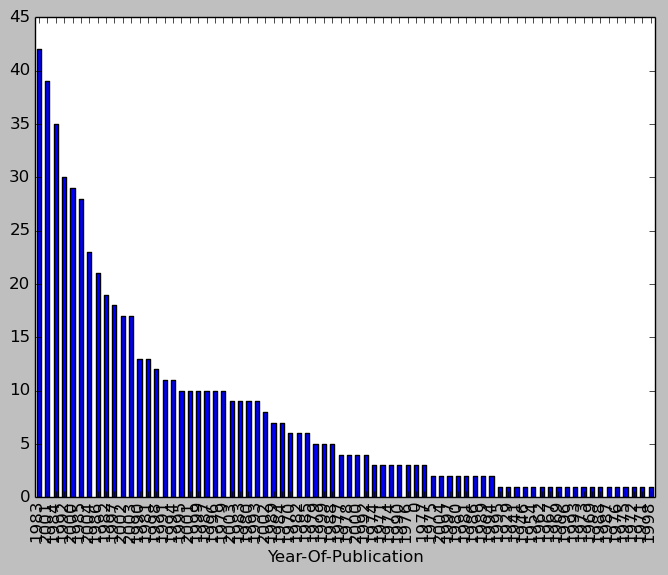

In [17]:
ag.drop(0).plot(kind='bar')

#### I'm guessing there are a lot of posthumus reissues. To look into this, I can get only the rows where the year is above 2000.  Recall that we have not yet converted the datatypes to their proper types, so we need to filter by year after applying the int conversion to the pub year column

In [18]:
agatha_books[agatha_books['Year-Of-Publication'].apply(int) >= 2000]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
1855,0451200993,Sleeping Murder (Miss Marple Mysteries (Paperb...,Agatha Christie,2000,New American Library
2355,0425173755,Murder on the Orient Express (Hercule Poirot M...,Agatha Christie,2000,Berkley Publishing Group
2356,0451199871,The Body in the Library (Miss Marple Mysteries...,Agatha Christie,2000,Signet Book
4725,0312979479,And Then There Were None : A Novel,Agatha Christie,2001,St. Martin's Paperbacks
5243,2253003964,Dix petits n�?¨gres,Agatha Christie,2002,LGF
5595,0312975120,The Unexpected Guest: A Mystery,Agatha Christie,2000,St. Martin's Press
8184,0425129616,The Mysterious Affair at Styles,Agatha Christie,2004,Berkley Publishing Group
8437,0312979509,Spider's Web,Agatha Christie,2001,St. Martin's Paperbacks
14705,2013218923,Le Crime de l'Orient-Express,Agatha Christie,2001,Hachette Jeunesse
19187,0425067858,The Labors of Hercules (Hercule Poirot Mysteri...,Agatha Christie,2004,Berkley Publishing Group


## any duplicates?

In [19]:
agatha_books.groupby(["Book-Title"]).size().sort_values(ascending=False)

Book-Title
And Then There Were None                                                                                                 7
Nemesis                                                                                                                  6
Murder on the Orient Express                                                                                             6
The Secret Adversary                                                                                                     5
The Murder of Roger Ackroyd                                                                                              5
Curtain                                                                                                                  5
CAT AMONG PIGEONS                                                                                                        4
A Caribbean Mystery                                                                                                      4
The S

#### Lots of duplicates, and these haven't even gone through an entity resolution process, so we can be sure that there are many more duplicates.

#### One last question, before we wrap up this  mystery..., is seeing why there were so many books of a particular title. Take for example, <u>And Then There Were None</u>.

In [20]:
agatha_books[agatha_books['Book-Title'] == 'And Then There Were None']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
2573,0671704664,And Then There Were None,Agatha Christie,1989,Pocket Books
6701,0425129586,And Then There Were None,Agatha Christie,1995,Berkley Publishing Group
22978,0671552228,And Then There Were None,Agatha Christie,1984,Pocket
42394,0553350005,And Then There Were None,Agatha Christie,0,Bantam Doubleday Dell
89373,0312330871,And Then There Were None,Agatha Christie,2004,St. Martin's Griffin
94967,067170608X,And Then There Were None,Agatha Christie,1991,Pocket Books
195340,0396085725,And Then There Were None,Agatha Christie,1985,Putnam Publishing Group


#### And there you go, reissues upon reissues, hmm.. why is the book published by Bantam published on year 0?

# Let's switch our attention to the users file now

In [21]:
users_df.head(10)

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17
4,5,"farnborough, hants, united kingdom",NaN
5,6,"santa monica, california, usa",61
6,7,"washington, dc, usa",NaN
7,8,"timmins, ontario, canada",NaN
8,9,"germantown, tennessee, usa",NaN
9,10,"albacete, wisconsin, spain",26


### some elementary questions I'd like to ask of the data are that, 

### given that each user writes their correct geographic location, which cities have the most readers?  

### What is the distribution of ages?

### How does this distribution vary from each major reader hub.

In [22]:
users_df.Location.str.split(",").str[0]


0                      nyc
1                 stockton
2                   moscow
3                    porto
4              farnborough
5             santa monica
6               washington
7                  timmins
8               germantown
9                 albacete
10               melbourne
11              fort bragg
12               barcelona
13              mediapolis
14                 calgary
15             albuquerque
16              chesapeake
17          rio de janeiro
18                  weston
19               langhorne
20          ferrol / spain
21                  erfurt
22            philadelphia
23                 cologne
24                 oakland
25                bellevue
26                 chicago
27                freiburg
28              cuernavaca
29               anchorage
                ...       
278828               boise
278829          springield
278830           anchorage
278831    new smyrna beach
278832               hanoi
278833               essen
2

In [23]:
# get city from a location string
get_city = lambda loc: loc.split(',')[0]

# this could have been accomplished with users_df.Location.str.split(",").str[0]
users_df["city"] = users_df.Location.apply(get_city)
users_df.groupby(["city"]).size().sort_values(ascending=False).head(10)

top_10_cities = list(users_df.groupby(["city"]).size().sort_values(ascending=False).head(10).index)
top_10_cities

['london',
 'barcelona',
 'toronto',
 'madrid',
 'sydney',
 'portland',
 'melbourne',
 'vancouver',
 'chicago',
 'seattle']

## Not much to do on a rainy muggy day in london is there? :)

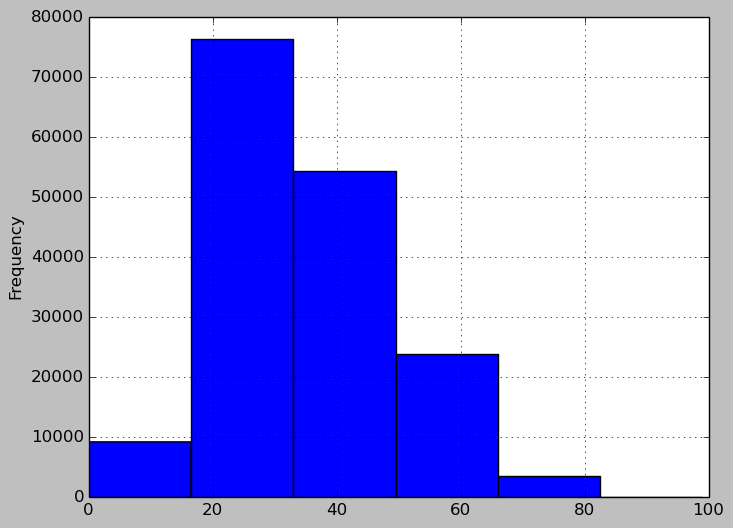

In [24]:
users_df[users_df.Age < 100].Age.dropna().plot(kind="hist", bins=6, grid=True)

### Older people tend to stop reading!? Oh wait, older people don't use technology to give people the impression that they are reading

In [25]:
# use the series, isin method to get rows that fit the criteria
# in our case, selecting only the rows that were in our top ten cities list
users_df_top10 = users_df[users_df.city.isin(top_10_cities)]

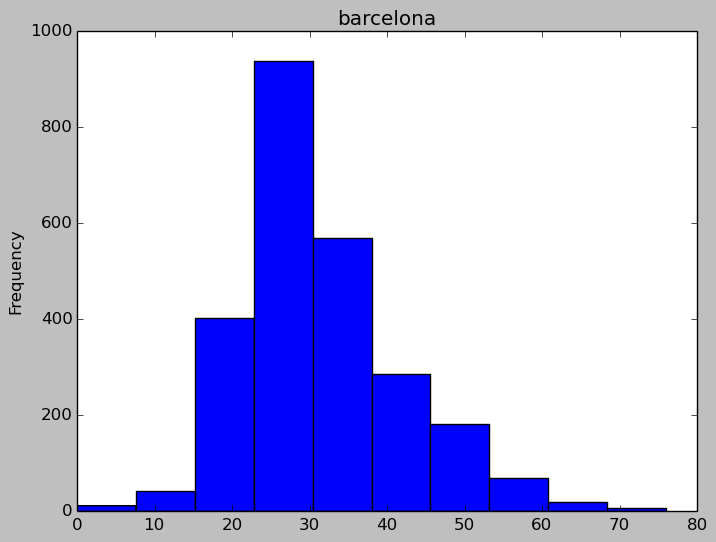

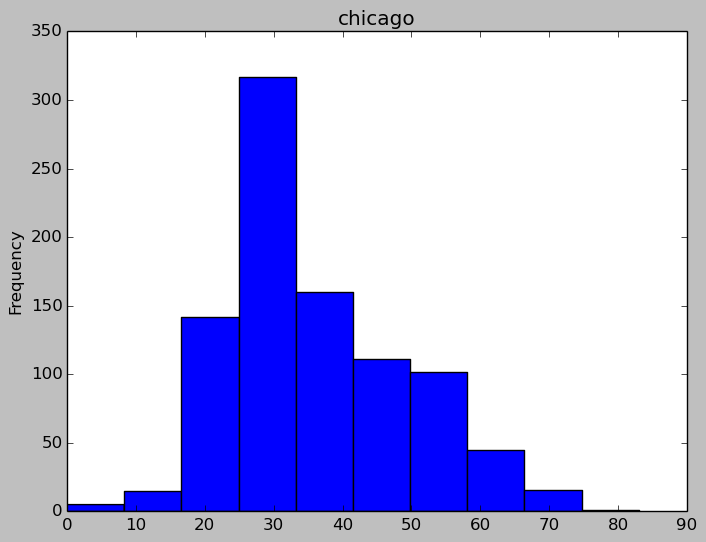

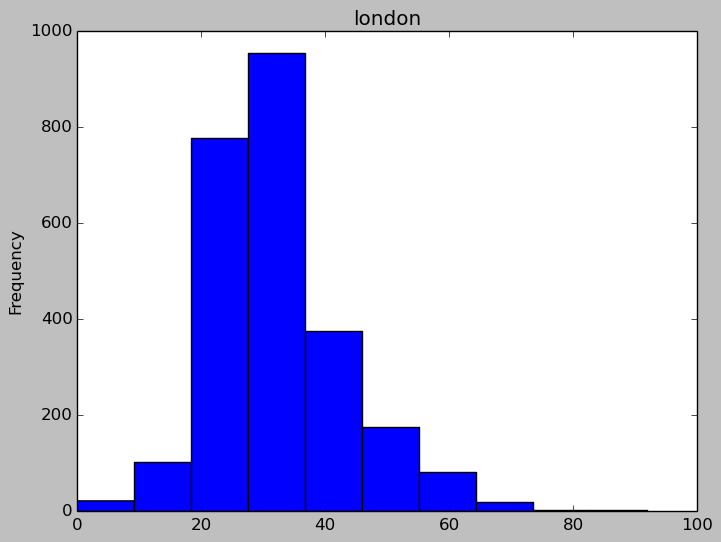

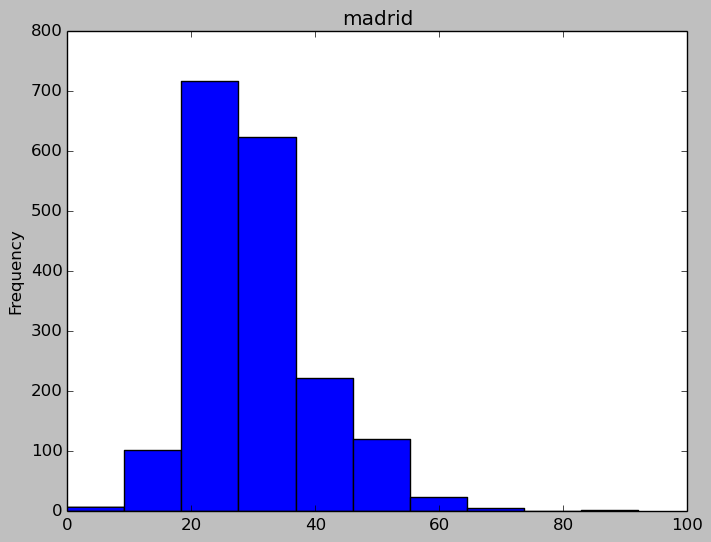

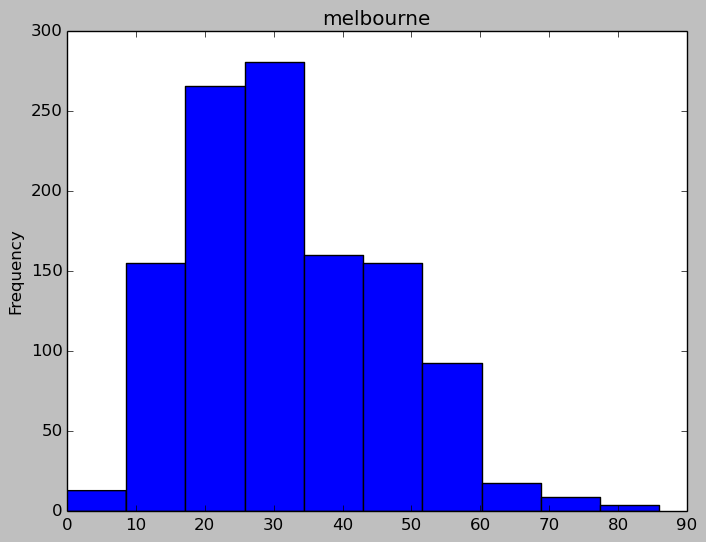

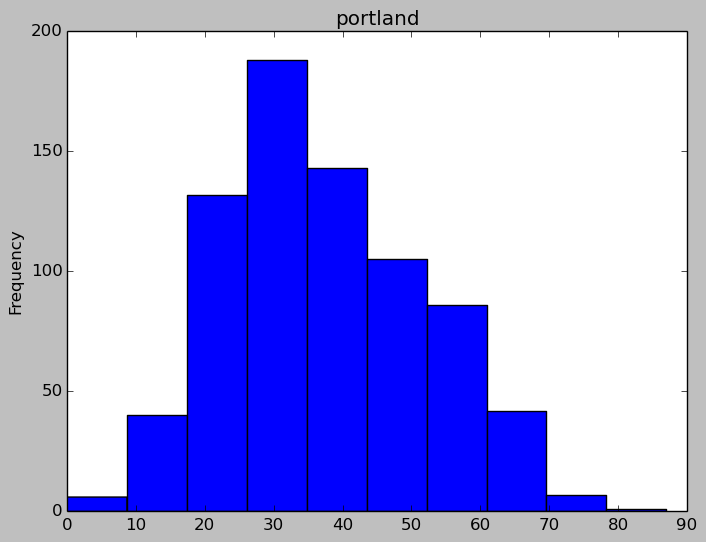

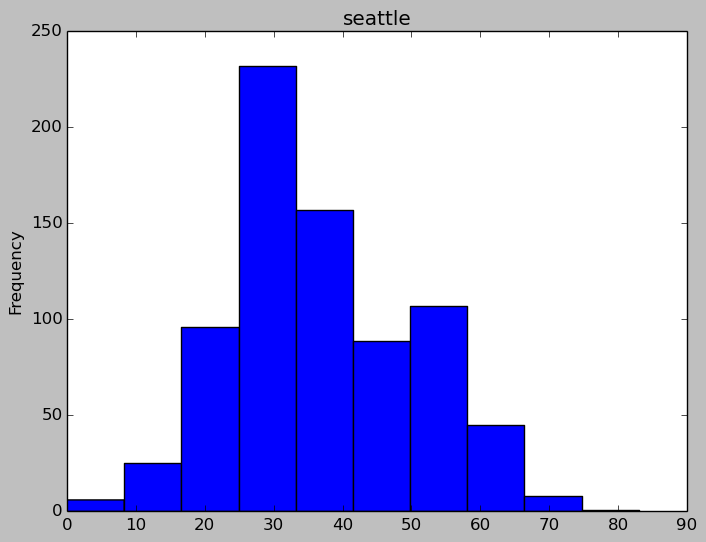

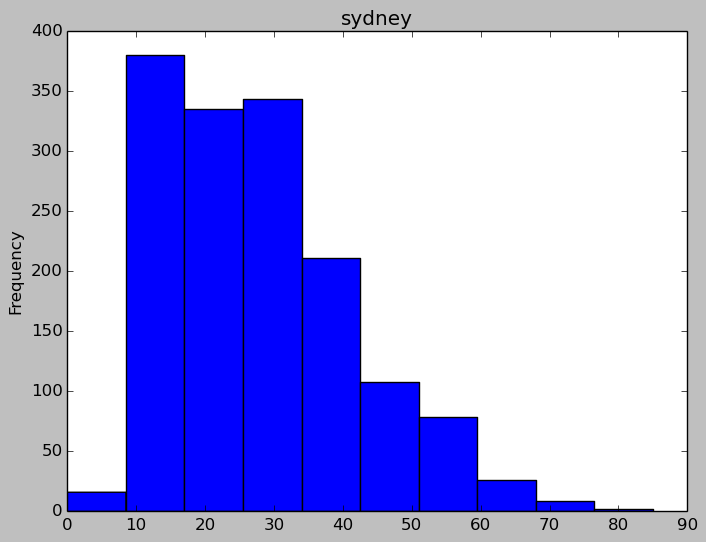

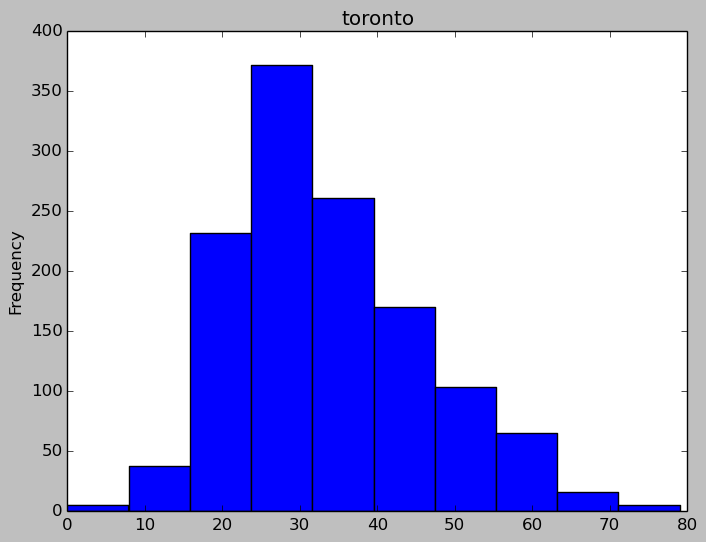

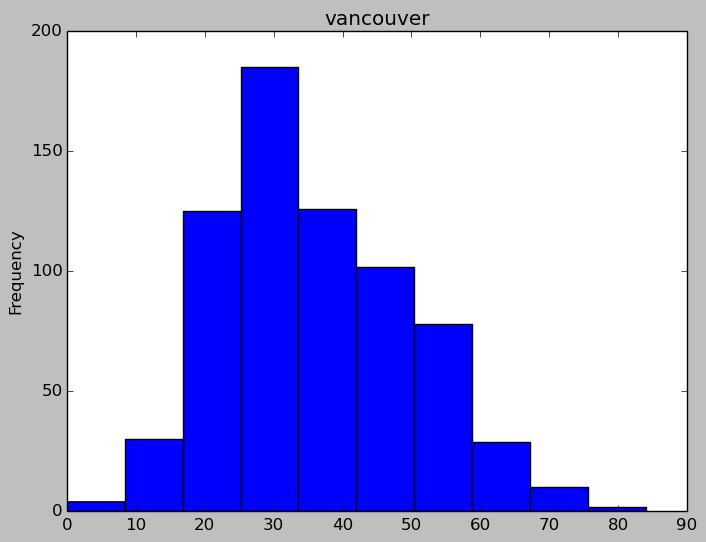

In [26]:
## let's see the variations of the reading ages across different cities
# use plt.subplot(id) for displaying them on same plot
for i, group in users_df_top10[users_df_top10.Age < 100].groupby(["city"]):
    plt.figure()
    group.Age.plot(kind="hist", title = str(i))

## most of the distributions seem to be similar.  However, Sydney seems to have the highest proportion of readers aged from 10 to 20.

# Next off let's examine the book ratings data

In [27]:
books_ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [28]:
books_ratings_df.describe()

,User-ID,Book-Rating
count,1149780.000000,1149780.000000
mean,140386.395126,2.866950
std,80562.277719,3.854184
min,2.000000,0.000000
25%,70345.000000,0.000000
50%,141010.000000,0.000000
75%,211028.000000,7.000000
max,278854.000000,10.000000


## A lot of 0 ratings.

## Let's see which users gave the most reviews along with which books recieved the most reviews.  But first, to get an idea of how the data is distributed, let's check out the histogram of ratings.

array([[<matplotlib.axes.AxesSubplot object at 0xaccecf2c>]], dtype=object)

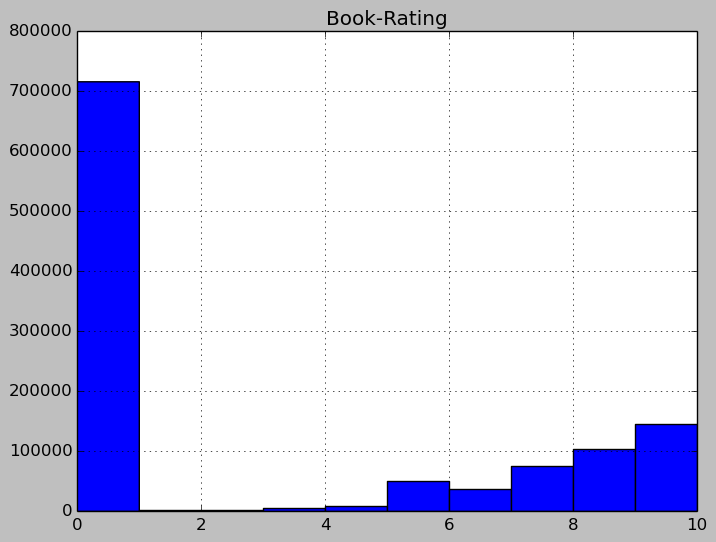

In [29]:
books_ratings_df.hist(column='Book-Rating', bins=10)

## Wow, a lot of negative nancys.  Basically, this rating system is skewed.

In [30]:
top_10_reviewers = books_ratings_df.groupby(['User-ID']).size().sort_values(ascending=False).head(10)

## Let's see what the distribution of ratings were for these top tenners.

In [31]:
top_10_reviewers_user_ids = list(books_ratings_df.groupby(['User-ID']).size().sort_values(ascending=False).head(10).index)

In [32]:
books_ratings_df[books_ratings_df['User-ID'].isin(top_10_reviewers)]['Book-Rating'].describe()

count    67.000000
mean      3.641791
std       3.910752
min       0.000000
25%       0.000000
50%       0.000000
75%       7.500000
max      10.000000
Name: Book-Rating, dtype: float64

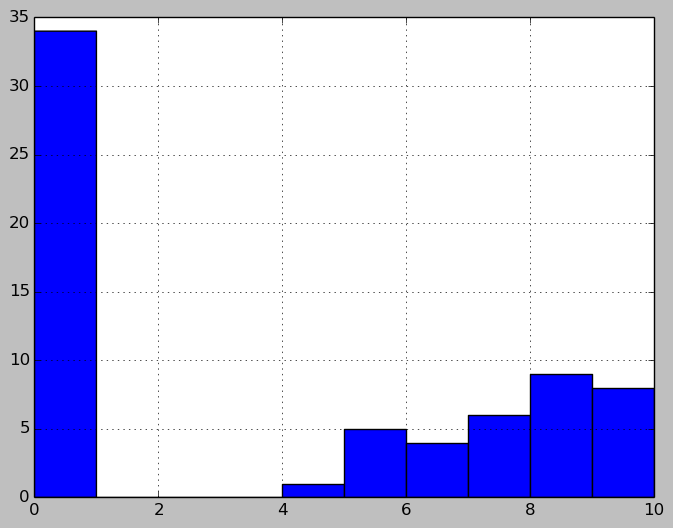

In [33]:
books_ratings_df[books_ratings_df['User-ID'].isin(top_10_reviewers)]['Book-Rating'].hist()

## Same as the overall distribution.  It's as if there is a divide at 5.  Either they liked it, or they didn't.  Fair enough, which books receieved the most reviews?

In [34]:
most_reviewed_books = books_ratings_df.groupby(['ISBN']).size().sort_values(ascending=False).head(10)
most_reviewed_books.values

array([2502, 1295,  883,  732,  723,  647,  639,  615,  614,  586], dtype=int64)

### Great we have some details about which books are hot, but it's difficult to see what books these users are reviewing because this table doesn't contain that information.  The solution to this problem is table joining.  Pandas let's you join two tables just like in SQL.  Let's try joining our top 10 reviewed books table.

In [35]:
# first construct a data frame out of the most_reviewed_books series
# a data frame can be constructed from a dict of lists, where each list is obtained from the index and values of
# the most_reviewed_books
most_reviewed_books_df = pd.DataFrame({'ISBN':most_reviewed_books.index, 'numReviews':most_reviewed_books.values})

In [36]:
most_reviewed_books_df

,ISBN,numReviews
0,0971880107,2502
1,0316666343,1295
2,0385504209,883
3,0060928336,732
4,0312195516,723
5,044023722X,647
6,0679781587,639
7,0142001740,615
8,067976402X,614
9,0671027360,586


In [37]:
most_reviewed_books_joined = pd.merge(books_df, most_reviewed_books_df, on="ISBN")

In [38]:
most_reviewed_books_joined

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,numReviews
0,0971880107,Wild Animus,Rich Shapero,2004,Too Far,2502
1,0671027360,Angels &amp; Demons,Dan Brown,2001,Pocket Star,586
2,044023722X,A Painted House,John Grisham,2001,Dell Publishing Company,647
3,0142001740,The Secret Life of Bees,Sue Monk Kidd,2003,Penguin Books,615
4,0316666343,The Lovely Bones: A Novel,Alice Sebold,2002,"Little, Brown",1295
5,0312195516,The Red Tent (Bestselling Backlist),Anita Diamant,1998,Picador USA,723
6,0385504209,The Da Vinci Code,Dan Brown,2003,Doubleday,883
7,0060928336,Divine Secrets of the Ya-Ya Sisterhood: A Novel,Rebecca Wells,1997,Perennial,732
8,067976402X,Snow Falling on Cedars,David Guterson,1995,Vintage Books USA,614


### Now you know which books are reviewed the most.  

### As a side note, now that we can join tables, let's see where those top 10 reviewers were from.<br>  Note that we could have just used the isin method to filter the original users table with the top_10_reviewers_ids

In [39]:
top_10_reviewers_df = pd.DataFrame({'User-ID': top_10_reviewers.index, 'numReviews':top_10_reviewers.values})

top_10_reviewers_joined = pd.merge(users_df, top_10_reviewers_df, on="User-ID")

In [40]:
top_10_reviewers_joined

,User-ID,Location,Age,city,numReviews
0,11676,"n/a, n/a, n/a",NaN,n/a,13602
1,35859,"duluth, minnesota, usa",NaN,duluth,5850
2,76352,"olympia, washington, usa",58,olympia,3367
3,98391,"morrow, georgia, usa",52,morrow,5891
4,110973,"wiley ford, west virginia, usa",43,wiley ford,3100
5,153662,"ft. stewart, georgia, usa",44,ft. stewart,6109
6,198711,"little canada, minnesota, usa",62,little canada,7550
7,212898,"la ronge, saskatchewan, canada",NaN,la ronge,4785
8,235105,"st louis, missouri, usa",46,st louis,3067
9,278418,"omaha, nebraska, usa",NaN,omaha,4533


### Could user 11676 have been an anonymous user?

## Before we begin using collaborative filtering to recommend books based on a users interests, let's see which books that were reviewed more than 100 times garnered the highest reviews.

In [41]:
# make sure to pass in sort=False to speed up this process
# as_index is used to prevent pandas from assigning our ISBN as indexes for the aggregate table

# first select the columns we want to include in our final aggregation, 
# then select which column you want to group by
numBookReviews = books_ratings_df[['ISBN', 'Book-Rating']].groupby(['ISBN'], sort=False, as_index=False)

# Here we are adding new columns to our df
# these are the results of the aggregating function applied on 'Book-Rating' column
# you can use a dictionary that will store the new column names as keys and functions 
# as the values.  These functions are going to be applied to the aggregated ratings

mean_ratings_and_counts = numBookReviews['Book-Rating'].agg({'num_ratings':len, 'mean_rating': np.mean})

In [42]:
most_reviewed_and_highly_rated_books = mean_ratings_and_counts[mean_ratings_and_counts.num_ratings>=100].sort_values(by=['mean_rating'], ascending=False).head(20)

In [43]:
pd.merge(books_df, most_reviewed_and_highly_rated_books, on="ISBN")

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,num_ratings,mean_rating
0,0446310786,To Kill a Mockingbird,Harper Lee,1988,Little Brown &amp; Company,389,4.920308
1,0451526341,Animal Farm,George Orwell,2004,Signet,164,4.695122
2,0440219078,The Giver (21st Century Reference),LOIS LOWRY,1994,Laure Leaf,178,4.915730
3,039592720X,Interpreter of Maladies,Jhumpa Lahiri,1999,Houghton Mifflin Co,127,4.874016
4,0671027344,The Perks of Being a Wallflower,Stephen Chbosky,1999,MTV,103,5.194175
5,0553296981,Anne Frank: The Diary of a Young Girl,ANNE FRANK,1993,Bantam,139,4.820144
6,0553375407,Ishmael: An Adventure of the Mind and Spirit,Daniel Quinn,1995,Bantam,162,4.907407
7,059035342X,Harry Potter and the Sorcerer's Stone (Harry P...,J. K. Rowling,1999,Arthur A. Levine Books,571,4.900175
8,0812550706,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1994,Tor Books,195,5.302564
9,0590353403,Harry Potter and the Sorcerer's Stone (Book 1),J. K. Rowling,1998,Scholastic,168,6.363095


## Too much Harry potter, let's get rid of them.

In [44]:
pd.merge(books_df[books_df['Book-Author'] != 'J. K. Rowling'], most_reviewed_and_highly_rated_books, on="ISBN")

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,num_ratings,mean_rating
0,0446310786,To Kill a Mockingbird,Harper Lee,1988,Little Brown &amp; Company,389,4.920308
1,0451526341,Animal Farm,George Orwell,2004,Signet,164,4.695122
2,0440219078,The Giver (21st Century Reference),LOIS LOWRY,1994,Laure Leaf,178,4.915730
3,039592720X,Interpreter of Maladies,Jhumpa Lahiri,1999,Houghton Mifflin Co,127,4.874016
4,0671027344,The Perks of Being a Wallflower,Stephen Chbosky,1999,MTV,103,5.194175
5,0553296981,Anne Frank: The Diary of a Young Girl,ANNE FRANK,1993,Bantam,139,4.820144
6,0553375407,Ishmael: An Adventure of the Mind and Spirit,Daniel Quinn,1995,Bantam,162,4.907407
7,0812550706,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1994,Tor Books,195,5.302564
8,0345339681,The Hobbit : The Enchanting Prelude to The Lor...,J.R.R. TOLKIEN,1986,Del Rey,281,5.007117
9,0064400557,Charlotte's Web (Trophy Newbery),E. B. White,1974,HarperTrophy,129,4.782946


In [45]:
books_df.loc[books_df['Year-Of-Publication'] == 'DK Publishing Inc','Year-Of-Publication'] = 2000

## There may be a way to normalize these ratings.  We'll find that out later.

* Methods, Z-scores and Mean-Centering

# Recommending based on collaborative filtering.

#### For this part we will switch over to using spark.

## First Feed the data into spark
We will be using a row class from the spark.sql class

In [270]:
with open(BOOK_RATINGS_FILE, 'r') as f:
    f.readline()
    l = enumerate(f.readlines())

In [ ]:
for i in l:
    print(l)

In [235]:
from pyspark.sql import Row
import re

def convertStringToAttribute(s):
    # match all number cols
    if re.match(r'^\d+$', s):
        s = 'v_'+s
    #starts with numbers but contains other non numbers
    elif re.match(r'^\d+\D+', s):
        s = '_'+s

    s = re.sub(r'-', "_", s)
    s = re.sub(r'\W', "", s)
    
    return s.lower()

def clean_row_values(row):
    return map(lambda v: v.strip().strip('"'), row)

def csvToRDD(csv_file, numCols=None, separator=',', headers=True, colNames = None, clean_col_names=False, index=False):
    """Load a csv file into an rdd. If headers or colNames are provided use
    those to name the columns of the rdd
    
    Params:
        csv_file (string): file name of csv file
        numCols     (int): number of columns to be considered
        separator   (str): separator for csv file
        headers     Bool): Whether the csv file contains headers
        colNames   (list): list of strings containing the specified colnames
        clean_col_names(bool): if true, convert col names to 
        index       (bool): add an index to the data
        
    Returns:
        rdd: the rdd containing the values from the csv.
    
    Raises:
        (ValueError): raised if len of colnames do not match numCols
        (IOError)   : raised if file does not exist
    """
    colNames = colNames
    first_row = None
   
    if not os.path.exists(csv_file):
        raise IOError("Couldn't open file: %s"%csv_file)
    else:
        fp = open(csv_file, 'r')
    
    if colNames is None and headers == True:
            # get the colNames
        colNames = fp.readline().split(separator)
        colNames = map(convertStringToAttribute, colNames)
    elif headers == True:
        fp.readline()
    
    row_ = Row(*colNames)
    
    if index:
        csvRDD = (sc
                 .parallelize(enumerate))
    
    csvRDD = (sc
              .parallelize(fp.readlines())
              .map(lambda s: s.split(separator))
              .map(lambda r: clean_row_values(r))
              .map(lambda row: row_(*row))
              .cache()
              )
            
    fp.close()
    
    return csvRDD
    

In [236]:
BOOK_RATINGS_RDD = csvToRDD(BOOK_RATINGS_FILE, separator=';').cache()
BOOK_RDD = csvToRDD(BOOKS_FILE, separator=';').cache()
USERS_RDD = csvToRDD(USERS_FILE, separator=';').cache()

In [48]:
map(lambda rdd: rdd.take(10), [BOOK_RATINGS_RDD,USERS_RDD, BOOK_RDD])

[[Row(user_id='276725', isbn='034545104X', book_rating='0'),
  Row(user_id='276726', isbn='0155061224', book_rating='5'),
  Row(user_id='276727', isbn='0446520802', book_rating='0'),
  Row(user_id='276729', isbn='052165615X', book_rating='3'),
  Row(user_id='276729', isbn='0521795028', book_rating='6'),
  Row(user_id='276733', isbn='2080674722', book_rating='0'),
  Row(user_id='276736', isbn='3257224281', book_rating='8'),
  Row(user_id='276737', isbn='0600570967', book_rating='6'),
  Row(user_id='276744', isbn='038550120X', book_rating='7'),
  Row(user_id='276745', isbn='342310538', book_rating='10')],
 [Row(user_id='1', location='nyc, new york, usa', age='NULL'),
  Row(user_id='2', location='stockton, california, usa', age='18'),
  Row(user_id='3', location='moscow, yukon territory, russia', age='NULL'),
  Row(user_id='4', location='porto, v.n.gaia, portugal', age='17'),
  Row(user_id='5', location='farnborough, hants, united kingdom', age='NULL'),
  Row(user_id='6', location='santa 

<hr>
### Here is an algorithm to predict what user A might feel about an item

### $$ P_{A,i} = \bar{r}_a + \frac{\sum_{u=1}^{n}(r_{u,i}-\bar{r}_u)w_{A,u}}{\sum_{u=1}^{n} w_{A,u}}$$

```python
def predictionForA_I(user, item, data):
    # data is rdd of all users
    user_ratings = data.filter(lambda row: row.user = user).map(lambda row: row.rating)
    user_avg = user_ratings.mean()
    
    other_users_i = data.filter(lambda row: row.item == item)
    
    weighted_ratings = other_users_i.map(lambda row: (row.rating-userAvg(row.user))*user_similarity(user, row.user))
    weighted_similarities = other_users_i.map(lambda row: user_similarity(user, row.user))
    return user_avg + weighted_ratings.sum()/weighted_similarities
```
    

In [145]:
def predictionForAnItem(user, item):
    neighborhood = [(u,int(r)) for u,r in itemUserBroadcast.value.get(item) if u != user]
    user_avg = user_ratings_mean_broadcast.value.get(user)
    weighted_ratings = map(lambda t: (t[1]-user_ratings_mean_broadcast.value.get(t[0]))*user_similarity(user, t[0]),
                          neighborhood)
    weighted_similarities = map(lambda t: user_similarity(user, t[0]), neighborhood)

    sum_weighted_similarities = sum(weighted_similarities)
    if sum_weighted_similarities == 0:
        return user_avg
    
    return user_avg + sum(weighted_ratings)/sum_weighted_similarities
    

In [114]:
itemUserBroadcast.value.get("0971880107")

[('276925', '0'),
 ('276939', '0'),
 ('276954', '0'),
 ('277042', '2'),
 ('277157', '0'),
 ('277378', '0'),
 ('277427', '0'),
 ('277478', '0'),
 ('277530', '0'),
 ('277932', '0'),
 ('278137', '0'),
 ('278176', '9'),
 ('278373', '0'),
 ('278514', '0'),
 ('14', '0'),
 ('193', '0'),
 ('242', '0'),
 ('487', '0'),
 ('569', '0'),
 ('626', '0'),
 ('899', '2'),
 ('901', '0'),
 ('970', '0'),
 ('1025', '0'),
 ('1140', '0'),
 ('1343', '0'),
 ('1435', '5'),
 ('1486', '5'),
 ('1733', '1'),
 ('1863', '0'),
 ('1903', '0'),
 ('2268', '0'),
 ('2411', '3'),
 ('2766', '6'),
 ('2830', '0'),
 ('2977', '0'),
 ('3032', '1'),
 ('3363', '0'),
 ('3556', '0'),
 ('4092', '0'),
 ('4131', '1'),
 ('4243', '0'),
 ('4285', '0'),
 ('4514', '0'),
 ('4571', '0'),
 ('4781', '0'),
 ('4784', '2'),
 ('5126', '5'),
 ('5264', '0'),
 ('5471', '0'),
 ('5506', '0'),
 ('5543', '0'),
 ('5581', '0'),
 ('5604', '6'),
 ('5815', '0'),
 ('5916', '0'),
 ('6095', '0'),
 ('6120', '0'),
 ('6251', '0'),
 ('6431', '4'),
 ('6507', '0'),
 ('654

## the similarity of the user is based on the pearson correlation coefficient
##  $$ similarity_{A,B} = \frac{\sum_{n=1}^{m} (r_{A,i} - \bar{A})(r_{B,i}-\bar{B})}{\sigma_A\sigma_B}$$

#### Where $\bar{A}$ is the average rating for user a and $\bar{B}$ is the average rating for user B.
#### Also, $A_{B,i}$ is the rating B gave to item i.  $\sigma_A$ is the standard deviation of the ratings of user A

## The python code from an rdd of ratings would therefore be

In [50]:
import itertools



def user_similarity(a,b):
    std_rating_A = user_ratings_std_broadcast.value.get(a, 0)
    std_rating_B = user_ratings_std_broadcast.value.get(b, 0)
    
    mean_rating_A  = user_ratings_mean_broadcast.value.get(a)
    mean_rating_B  = user_ratings_mean_broadcast.value.get(b)
    
    user_A_items  = user_items_rdd_broadcast.value.get(a)
    user_B_items = user_items_rdd_broadcast.value.get(b)
    
    # similar books
    aggregate = sorted(user_A_items+user_B_items, key=lambda t: t[0])
    aggregate = itertools.groupby(aggregate, key=lambda t: t[0])
    common_items = map(lambda t: t[0], 
                       (filter(lambda t: len(t[1]) > 1, 
                               map(lambda t: (t[0],list(t[1])) , aggregate))))
    
    user_A_items = dict(user_A_items)
    user_B_items = dict(user_B_items)

    sum_prod_differences = sum(
        map(lambda item: 
            (user_A_items.get(item)-mean_rating_A)*(user_B_items.get(item)-mean_rating_B),
            common_items)
        )


    if std_rating_A == 0 or std_rating_B == 0 or np.isnan(sum_prod_differences):
        return 0
    
    return sum_prod_differences/std_rating_A/std_rating_B
    


## Let's make the recommendation engine then...

#### First we need tidbits of info, 
* we'll need to figure out how to calculate the standard deviation of ratings for a user
* we'll need to figure out a way to do these calculations succinctly

In [51]:
# for the first part, spark provides a sample standard deviation
def std(item_ratings):
    """ Returns standard deviation
    Params:
        item_ratings (list): list of item ratings
    returns:
        float: standard deviation of list of values
    """
    return np.std(item_ratings)


## Make an rdd of all the standard deviations for each user

In [52]:
def user_item_tuple(row):
    return (row.user_id, [(row.isbn, int(row.book_rating))])




user_items_rdd = BOOK_RATINGS_RDD.map(user_item_tuple).reduceByKey(lambda r1,r2: r1+r2).cache()

user_items_rdd_broadcast = sc.broadcast(user_items_rdd.collectAsMap())


In [53]:
user_items_rdd.take(5)

[('228054',
  [('0425162591', 0),
   ('0553571834', 0),
   ('0743442318', 0),
   ('155166268X', 6)]),
 ('228050',
  [('0006551742', 0),
   ('0140258345', 9),
   ('0140280391', 2),
   ('0393321037', 0),
   ('0413742504', 6),
   ('1862075565', 7)]),
 ('228053', [('055327872X', 7)]),
 ('228052', [('1562477676', 0)]),
 ('89372', [('1405034165', 0)])]

In [54]:
user_ratings_std = (user_items_rdd.map(lambda t: (t[0], map(lambda item_t: item_t[1], t[1])))
                    .map(lambda t: (t[0], std(t[1]))))

In [55]:
user_ratings_std.takeOrdered(5,key=lambda t: -1*t[1])

[('5984', 5.0),
 ('243805', 5.0),
 ('198998', 5.0),
 ('175080', 5.0),
 ('31761', 5.0)]

In [56]:
user_ratings_std_broadcast = sc.broadcast(user_ratings_std.collectAsMap())

## Make an rdd of all the means of the ratings

In [57]:
user_ratings_mean = (user_items_rdd.map(lambda t: (t[0], map(lambda item_t: item_t[1], t[1])))
                    .map(lambda t: (t[0], np.mean(t[1]))))

user_ratings_mean.take(10)

[('228054', 1.5),
 ('228050', 4.0),
 ('228053', 7.0),
 ('228052', 0.0),
 ('89372', 0.0),
 ('89374', 0.0),
 ('89375', 5.0),
 ('89376', 8.0),
 ('89377', 9.0),
 ('252568', 10.0)]

In [58]:
user_ratings_mean_broadcast = sc.broadcast(user_ratings_mean.collectAsMap())

In [59]:
user_A_items = BOOK_RATINGS_RDD.filter(lambda row: row.user_id == '2281').map(lambda row: (row.isbn, int(row.book_rating)))

In [60]:
user_A_items.collect()

[('0061008427', 3),
 ('0380718340', 0),
 ('0425098648', 0),
 ('0425181103', 7),
 ('0786001690', 0),
 ('0886777631', 0)]

## Each lookup takes approximately 4 seconds.  There are a lot of users so in the long run it is not feasible to keep on having to look up this data.  You need to store an intermediate result for quicker lookup processing.

In [61]:
user_items_rdd.take(1)

[('228054',
  [('0425162591', 0),
   ('0553571834', 0),
   ('0743442318', 0),
   ('155166268X', 6)])]

In [62]:
print user_ratings_mean_broadcast.value.get('82164')

a = user_similarity('176230', '82164')

0.795454545455


In [63]:
a

0

## experiment

In [64]:
a = '82164'
b = '176230'

In [65]:
user_similarity(a,b)

0

In [66]:
user_A_items = user_items_rdd.filter(lambda t: t[0] == a).flatMap(lambda t: t[1])
user_B_items = user_items_rdd.filter(lambda t: t[0] == b).flatMap(lambda t: t[1])
    

In [67]:
user_A_items.collect()

[('006052779X', 0),
 ('0061000108', 0),
 ('0061009059', 5),
 ('0061013315', 0),
 ('0064400557', 0),
 ('0064410935', 0),
 ('0140073094', 0),
 ('0140230653', 0),
 ('0312167628', 5),
 ('0312877528', 0),
 ('0316048216', 0),
 ('0316769487', 0),
 ('0330299891', 0),
 ('0330323032', 0),
 ('0330375253', 0),
 ('0340689072', 0),
 ('0345448804', 0),
 ('0373835353', 0),
 ('0375707972', 5),
 ('0380002957', 0),
 ('0380490986', 8),
 ('038078260X', 0),
 ('03809742233', 0),
 ('0380978423', 0),
 ('0385246641', 0),
 ('0385316879', 0),
 ('0399136525', 0),
 ('0399142495', 0),
 ('042507255X', 0),
 ('0425135039', 0),
 ('0425165388', 0),
 ('0425171396', 0),
 ('042517364X', 0),
 ('0440107628', 0),
 ('0440148170', 0),
 ('044018438X', 0),
 ('0440211891', 0),
 ('0440212561', 9),
 ('0440224764', 0),
 ('044022604X', 0),
 ('0440235502', 0),
 ('0440236061', 0),
 ('0440241537', 7),
 ('0440430909', 0),
 ('0446350109', 0),
 ('0446353426', 0),
 ('0446525502', 0),
 ('0446603066', 0),
 ('0446605239', 7),
 ('0446610178', 0),

In [68]:
test_rdd = sc.parallelize([('006109207X', 10)])
common_items = user_B_items.join(test_rdd)

In [69]:
common_items.collect()

[('006109207X', (0, 10))]

In [70]:
user_ids = BOOK_RATINGS_RDD.map(lambda row: row.user_id).distinct()
user_ids.count()

105283

## let's not blow up our computer

In [79]:
sampled_user_ids = user_ids.sample(False, .02).cache()

In [80]:
user_to_user_cart = sampled_user_ids.cartesian(sampled_user_ids).cache()

In [81]:
user_to_user_cart.count()

4739329

In [82]:
l = user_to_user_cart.map(lambda t: (t[0],t[1],user_similarity(t[0],t[1]))).cache()

In [83]:
l = l.filter(lambda t: t[0] != t[1]).cache()

In [103]:
l.takeOrdered(1000, key=lambda t: -1*t[2])[-10:]

[('113270', '158241', 1.5331907909621605),
 ('158241', '113270', 1.5331907909621605),
 ('277629', '191883', 1.5331481007912025),
 ('191883', '277629', 1.5331481007912025),
 ('39616', '236757', 1.532125857098642),
 ('236757', '39616', 1.532125857098642),
 ('182085', '46099', 1.5318766128855354),
 ('46099', '182085', 1.5318766128855354),
 ('1812', '103834', 1.531455574522421),
 ('103834', '1812', 1.5314555745224208)]

In [84]:
users_df[users_df['User-ID'].isin([27838   , 170634  ])]

,User-ID,Location,Age,city
27837,27838,"new haven,, connecticut, usa",NaN,new haven
170633,170634,"crystal lake, illinois, usa",NaN,crystal lake


In [102]:
books_ratings_df[books_ratings_df.ISBN == '042518272X'][ books_ratings_df['User-ID'].isin([27838,170634])]

/usr/local/lib/python2.7/dist-packages/pandas/core/frame.py:1942: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  "DataFrame index.", UserWarning)


,User-ID,ISBN,Book-Rating
121321,27838,042518272X,5
701353,170634,042518272X,0


In [90]:
books_ratings_df[books_ratings_df['User-ID'].isin([27838, 170634 ])].groupby('ISBN')['Book-Rating'].count().sort_values(ascending=False)

ISBN
042518272X    2
0385504209    2
1891105035    1
0446523232    1
0440226198    1
044022859X    1
0440235650    1
0440411238    1
044041833X    1
0440550688    1
0446611085    1
043935806X    1
0446677507    1
0448095408    1
0448095416    1
0448095424    1
0448095432    1
0448095440    1
0449206211    1
0440211263    1
0439139597    1
0399215409    1
0425189945    1
0425052427    1
0425165566    1
0425179184    1
0425179451    1
0425180964    1
0425185249    1
0439049962    1
             ..
074321367X    1
0743418581    1
0743428323    1
0761121382    1
0761128182    1
0763606855    1
076455395X    1
0766800598    1
0783503253    1
0785308202    1
0688058523    1
0679889310    1
0671013955    1
0679863737    1
0671013971    1
067101465X    1
0671021168    1
0671025597    1
0671027387    1
0671035916    1
0671042386    1
0671042394    1
0671042424    1
0671042432    1
0671047574    1
0671793985    1
0671794388    1
067980370X    1
0679819487    1
006008460X    1
Name: Book-Rating, 

In [92]:
books_df[books_df.ISBN == '042518272X']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
20494,042518272X,Truffled Feathers,Nancy Fairbanks,2001,Berkley Publishing Group


In [108]:
# you need a reverse lookup for items, this will be used in the prediction function
itemUserRDD = (BOOK_RATINGS_RDD
               .map(lambda row: (row.isbn, [(row.user_id, row.book_rating)]))
               .reduceByKey(lambda r1,r2: r1+r2)
               .cache())

In [113]:
itemUserBroadcast = sc.broadcast(itemUserRDD.collectAsMap())

In [167]:
sampUser = '27838'

In [176]:
isbns = BOOK_RATINGS_RDD.filter(lambda row: row.user_id != sampUser).map(lambda row: row.isbn).distinct().cache()

In [177]:
isbns.count()

340556

In [178]:
isbns.map(lambda isbn: (isbn, predictionForAnItem(sampUser, isbn))).takeOrdered(10, key=lambda t: -1*t[1])

Py4JJavaError: An error occurred while calling z:org.apache.spark.api.python.PythonRDD.collectAndServe.
: org.apache.spark.SparkException: Job 29 cancelled because Stage 51 was cancelled
	at org.apache.spark.scheduler.DAGScheduler.org$apache$spark$scheduler$DAGScheduler$$failJobAndIndependentStages(DAGScheduler.scala:1204)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:1154)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleStageCancellation$1.apply$mcVI$sp(DAGScheduler.scala:1142)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleStageCancellation$1.apply(DAGScheduler.scala:1141)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleStageCancellation$1.apply(DAGScheduler.scala:1141)
	at scala.collection.IndexedSeqOptimized$class.foreach(IndexedSeqOptimized.scala:33)
	at scala.collection.mutable.ArrayOps$ofInt.foreach(ArrayOps.scala:156)
	at org.apache.spark.scheduler.DAGScheduler.handleStageCancellation(DAGScheduler.scala:1141)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1366)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1354)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:48)


## Using MLIB

In [224]:
a='a'
a.isalpha()

True

In [228]:
def replaceXinISBN(isbn):
    return "".join([i if i.isdigit() else str(ord(i)) for i in isbn])

In [234]:
replaceXinISBN("052165615X")

5216561588L

In [230]:
#create training, test, validation set
trainingRDD, validationRDD, testRDD = BOOK_RATINGS_RDD.map(lambda r: (r[0],replaceXinISBN(r[1]), int(r[2]))).randomSplit([6,2,2], seed=1L)

In [231]:
trainingRDD.count(), validationRDD.count(), testRDD.count()

(689752, 230036, 229992)

In [232]:
testRDD.take(1)[0], trainingRDD.take(1)

(('276725', '03454510488', 0), [('276726', '0155061224', 5)])

In [203]:
def computeError(predictedRDD, actualRDD):
    predictedReformattedRDD = predictedRDD.map(lambda t: ((t[0], t[1]),t[2]))
    actualReformattedRDD = actualRDD.map(lambda t: ((t[0], t[1]),t[2]))
    
    squaredErrorsRDD = (predictedReformattedRDD
                        .join(actualReformattedRDD)
                        .mapValues(lambda t: (t[1]-t[0])**2))
    
    totalError = squaredErrorsRDD.map(lambda t: t[1]).sum()
    numRatings = squaredErrorsRDD.count()
    return (totalError/float(numRatings))**.5


In [191]:
from pyspark.mllib.recommendation import ALS

In [204]:
validationForPredictRDD = validationRDD.map(lambda t: (t[0], t[1]))

In [233]:
seed = 4L
iterations = 5
regularationParameter = 0.1
ranks = [4,8,12]
errors = [0,0,0]

err = 0
tolerance = 0.03

minError = float('inf')
bestRank = -1
bestIteration = -1
for rank in ranks[:1]:
    model = ALS.train(trainingRDD, rank, seed=seed, iterations=iterations,
                     lambda_=regularationParameter)
    predictedRatingsRDD = model.predictAll(validationForPredictRDD)
    error = computeError(predictedRatingsRDD, validationRDD)
    errors[err] = error
    err += 1
    print("For rank {} the RMSE is {}".format(rank,error))
    if error < minError:
        minError = error
        bestRank = rank
        
print 'The best is rank {}'.format(bestRank)

Py4JJavaError: An error occurred while calling o924.trainALSModel.
: org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 96.0 failed 1 times, most recent failure: Lost task 0.0 in stage 96.0 (TID 78, localhost): java.lang.ClassCastException: java.lang.Long cannot be cast to java.lang.Integer
	at scala.runtime.BoxesRunTime.unboxToInt(BoxesRunTime.java:106)
	at org.apache.spark.mllib.api.python.SerDe$RatingPickler.construct(PythonMLLibAPI.scala:1027)
	at net.razorvine.pickle.Unpickler.load_reduce(Unpickler.java:617)
	at net.razorvine.pickle.Unpickler.dispatch(Unpickler.java:170)
	at net.razorvine.pickle.Unpickler.load(Unpickler.java:84)
	at net.razorvine.pickle.Unpickler.loads(Unpickler.java:97)
	at org.apache.spark.mllib.api.python.SerDe$$anonfun$pythonToJava$1$$anonfun$apply$1.apply(PythonMLLibAPI.scala:1088)
	at org.apache.spark.mllib.api.python.SerDe$$anonfun$pythonToJava$1$$anonfun$apply$1.apply(PythonMLLibAPI.scala:1087)
	at scala.collection.Iterator$$anon$13.hasNext(Iterator.scala:371)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:327)
	at scala.collection.Iterator$$anon$13.hasNext(Iterator.scala:371)
	at scala.collection.Iterator$$anon$12.hasNext(Iterator.scala:350)
	at org.apache.spark.util.collection.ExternalSorter.insertAll(ExternalSorter.scala:210)
	at org.apache.spark.shuffle.sort.SortShuffleWriter.write(SortShuffleWriter.scala:63)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:68)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:41)
	at org.apache.spark.scheduler.Task.run(Task.scala:64)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:203)
	at java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1145)
	at java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:615)
	at java.lang.Thread.run(Thread.java:745)

Driver stacktrace:
	at org.apache.spark.scheduler.DAGScheduler.org$apache$spark$scheduler$DAGScheduler$$failJobAndIndependentStages(DAGScheduler.scala:1204)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$abortStage$1.apply(DAGScheduler.scala:1193)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$abortStage$1.apply(DAGScheduler.scala:1192)
	at scala.collection.mutable.ResizableArray$class.foreach(ResizableArray.scala:59)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:47)
	at org.apache.spark.scheduler.DAGScheduler.abortStage(DAGScheduler.scala:1192)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleTaskSetFailed$1.apply(DAGScheduler.scala:693)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleTaskSetFailed$1.apply(DAGScheduler.scala:693)
	at scala.Option.foreach(Option.scala:236)
	at org.apache.spark.scheduler.DAGScheduler.handleTaskSetFailed(DAGScheduler.scala:693)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1393)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1354)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:48)


In [253]:
accum = sc.accumulator(0)

In [241]:
accum.add(1)

In [261]:
class AVal:
    def __init__(self, acc):
        self.a = acc
    def increment(self):
        self.a.add(1)
    def val(self):
        return self.a.value
    
    

In [262]:
aval = AVal(accum)

In [263]:
new_rdd = BOOK_RDD.map(lambda t: aval.increment() or (aval.val(), t[0], t[1], t[2]))

In [265]:
new_rdd = sc.parallelize(enumerate(BOOK_RDD.collect()))

In [269]:
new_rdd.map(lambda t: (t[0], t[1][0], t[1][1], t[1][2])).take(1000)

[(0, '0195153448', 'Classical Mythology', 'Mark P. O. Morford'),
 (1, '0002005018', 'Clara Callan', 'Richard Bruce Wright'),
 (2, '0060973129', 'Decision in Normandy', "Carlo D'Este"),
 (3,
  '0374157065',
  'Flu: The Story of the Great Influenza Pandemic of 1918 and the Search for the Virus That Caused It',
  'Gina Bari Kolata'),
 (4, '0393045218', 'The Mummies of Urumchi', 'E. J. W. Barber'),
 (5, '0399135782', "The Kitchen God's Wife", 'Amy Tan'),
 (6,
  '0425176428',
  "What If?: The World's Foremost Military Historians Imagine What Might Have Been",
  'Robert Cowley'),
 (7, '0671870432', 'PLEADING GUILTY', 'Scott Turow'),
 (8,
  '0679425608',
  'Under the Black Flag: The Romance and the Reality of Life Among the Pirates',
  'David Cordingly'),
 (9, '074322678X', "Where You'll Find Me: And Other Stories", 'Ann Beattie'),
 (10, '0771074670', 'Nights Below Station Street', 'David Adams Richards'),
 (11,
  '080652121X',
  "Hitler's Secret Bankers: The Myth of Swiss Neutrality During t